# <span style="color:blue">Intrusion Detection System (IDS) using Machine Learning and Q&A</span>


The goal of this project is to develop an Intrusion Detection System (IDS) using machine learning techniques to detect Distributed Denial of Service (DDoS) attacks in network traffic. DDoS attacks are a major cybersecurity concern, where multiple compromised systems are used to flood a target server with traffic, disrupting its services.

### In this project, we did:
- Analyze and preprocess a dataset of network traffic, identifying patterns and features that can help differentiate between normal and attack traffic.
- Train machine learning models using algorithms like:
  - Logistic Regression
  - Random Forest
  - XGBoost
  - AdaBoost
  - Gradient Boost
- Classify network traffic as either **BENIGN** or **DDoS**.
- Evaluate the performance of the models, compare different algorithms, and tune the best model to improve its accuracy.
- Provide insights on the most significant features contributing to DDoS detection.
- Propose improvements for better detection capabilities.

### Data Description

The dataset used for this project is the **Network Intrusion Dataset (CIC-IDS-2017)**, which was sourced from Kaggle. This dataset contains network traffic data for both benign (normal) traffic and various types of attacks, including Distributed Denial of Service (DDoS) attacks. The dataset is widely used for Intrusion Detection System (IDS) development and testing.

#### Key Characteristics of the Dataset:
- **Source**: The dataset is available on Kaggle at [Network Intrusion Dataset (CIC-IDS-2017)](https://www.kaggle.com/datasets/chethuhn/network-intrusion-dataset/data).
- **Size**: The dataset includes records from real-world network traffic, containing millions of rows with detailed network traffic information.
- **Features**: Some of the key features include:
  - `Destination Port`
  - `Flow Duration`
  - `Total Fwd Packets`
  - `Flow Bytes/s`
  - `Flow Packets/s`
  - `Label` (indicating whether the traffic is **BENIGN** or **DDoS**)
- **Target Variable**: The **Label** feature, which identifies the type of traffic:
  - **BENIGN**: Normal network traffic
  - **DDoS**: Distributed Denial of Service attack traffic

### Methods Used to Explore the Data

1. **Initial Exploration**:
   - The dataset was loaded, and its structure was examined to understand the number of records and features.
   - The first few rows were printed to check the format and identify any issues like missing or incorrect values.

2. **Data Cleaning**:
   - **Handling Missing Values**: Missing data was handled by imputation (replacing with zeros or mean values), ensuring the dataset is complete.
   - **Handling Infinite Values**: Any infinite values present were replaced with zeros to prevent them from affecting model training.
   - **Feature Type Validation**: Ensured that all features are of the correct data type, especially the numerical features, which are crucial for machine learning models.

3. **Data Preprocessing**:
   - **Label Encoding**: The `Label` feature was encoded into binary values (`0` for BENIGN and `1` for DDoS) to facilitate model training.
   - **Feature Scaling**: Continuous numerical features were scaled using **StandardScaler** to standardize the data, ensuring that no feature disproportionately influences the model.

4. **Exploratory Data Analysis (EDA)**:
   - **Class Distribution**: We checked the distribution of the target variable (`Label`) to detect any imbalances between normal and attack traffic.
   - **Correlation Matrix**: A correlation matrix was generated to examine relationships between features and identify highly correlated ones.
   - **Feature Importance**: We used tree-based models (e.g., Random Forest) to identify the most significant features for DDoS detection.

5. **Data Transformation**:
   - Feature engineering was applied to create additional features or modify existing ones to better capture patterns in the traffic data.
  



1. Set Up the Environment
Ensure that you have the required libraries installed:

In [1]:
!pip install numpy pandas scikit-learn xgboost matplotlib seaborn



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip



2. Import Required Libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier
import xgboost as xgb
from sklearn.metrics import mean_squared_error, f1_score


3. Load and Inspect the Dataset
First, load the dataset and inspect its structure:

In [3]:
# Load the dataset
df = pd.read_csv('C:/Users/aaron/Desktop/archive/archive/data/Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv')

# Display first few rows and check columns
print(df.head())
df.shape



    Destination Port   Flow Duration   Total Fwd Packets  \
0              54865               3                   2   
1              55054             109                   1   
2              55055              52                   1   
3              46236              34                   1   
4              54863               3                   2   

    Total Backward Packets  Total Length of Fwd Packets  \
0                        0                           12   
1                        1                            6   
2                        1                            6   
3                        1                            6   
4                        0                           12   

    Total Length of Bwd Packets   Fwd Packet Length Max  \
0                             0                       6   
1                             6                       6   
2                             6                       6   
3                             6                 

(225745, 79)

To check the central tendencies, spread, and range of the data, helping to detect any potential outliers or skewness in the numerical features.

In [4]:
print(df.describe())


c:\Python312\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)
c:\Python312\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


        Destination Port   Flow Duration   Total Fwd Packets  \
count       225745.00000    2.257450e+05       225745.000000   
mean          8879.61946    1.624165e+07            4.874916   
std          19754.64740    3.152437e+07           15.422874   
min              0.00000   -1.000000e+00            1.000000   
25%             80.00000    7.118000e+04            2.000000   
50%             80.00000    1.452333e+06            3.000000   
75%             80.00000    8.805237e+06            5.000000   
max          65532.00000    1.199999e+08         1932.000000   

        Total Backward Packets  Total Length of Fwd Packets  \
count            225745.000000                225745.000000   
mean                  4.572775                   939.463346   
std                  21.755356                  3249.403484   
min                   0.000000                     0.000000   
25%                   1.000000                    26.000000   
50%                   4.000000               

In [5]:
print(df.columns)
print(df.dtypes)
df.columns = df.columns.str.strip()  # This removes any extra spaces from column names


Index([' Destination Port', ' Flow Duration', ' Total Fwd Packets',
       ' Total Backward Packets', 'Total Length of Fwd Packets',
       ' Total Length of Bwd Packets', ' Fwd Packet Length Max',
       ' Fwd Packet Length Min', ' Fwd Packet Length Mean',
       ' Fwd Packet Length Std', 'Bwd Packet Length Max',
       ' Bwd Packet Length Min', ' Bwd Packet Length Mean',
       ' Bwd Packet Length Std', 'Flow Bytes/s', ' Flow Packets/s',
       ' Flow IAT Mean', ' Flow IAT Std', ' Flow IAT Max', ' Flow IAT Min',
       'Fwd IAT Total', ' Fwd IAT Mean', ' Fwd IAT Std', ' Fwd IAT Max',
       ' Fwd IAT Min', 'Bwd IAT Total', ' Bwd IAT Mean', ' Bwd IAT Std',
       ' Bwd IAT Max', ' Bwd IAT Min', 'Fwd PSH Flags', ' Bwd PSH Flags',
       ' Fwd URG Flags', ' Bwd URG Flags', ' Fwd Header Length',
       ' Bwd Header Length', 'Fwd Packets/s', ' Bwd Packets/s',
       ' Min Packet Length', ' Max Packet Length', ' Packet Length Mean',
       ' Packet Length Std', ' Packet Length Variance', '

4. Preprocess the Data (Combine All Steps)
In this step, we’ll perform the following actions:

Convert the 'Label' column to binary values (0 for BENIGN, 1 for DDoS).
Fill missing values with zeros.
Handle infinite values by replacing them with zero.
Standardize the features using StandardScaler.
Split the data into 80% training and 20% testing.

In [7]:
# Convert the 'Label' column to binary values
df['Label'] = df['Label'].map({'BENIGN': 0, 'DDoS': 1})

# Fill missing values with 0
df_filled = df.fillna(0)

# Select features and target variable
X = df_filled[['Destination Port', 'Flow Duration', 'Total Fwd Packets', 'Total Backward Packets', 
                'Total Length of Fwd Packets', 'Total Length of Bwd Packets', 'Flow Bytes/s', 'Flow Packets/s']].values
y = df_filled['Label']

# Replace infinite values with 0
X = np.where(np.isinf(X), 0, X)

# Split the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Impute missing values with 0 and scale features
imputer = SimpleImputer(strategy='constant', fill_value=0)
X_train_filled = imputer.fit_transform(X_train)
X_test_filled = imputer.transform(X_test)

scaler = StandardScaler()
X_scaled_train = scaler.fit_transform(X_train_filled)
X_scaled_test = scaler.transform(X_test_filled)


### Data visualizations

#### This visualization reveals the class distribution (e.g., BENIGN vs. DDoS). Visualizing this helps us understand if the dataset is balanced or if one class is overrepresented. The bar for Label 1 (likely representing DDoS) is slightly higher than the bar for Label 0 (likely representing BENIGN). This indicates that the dataset is somewhat imbalanced but not drastically so. 

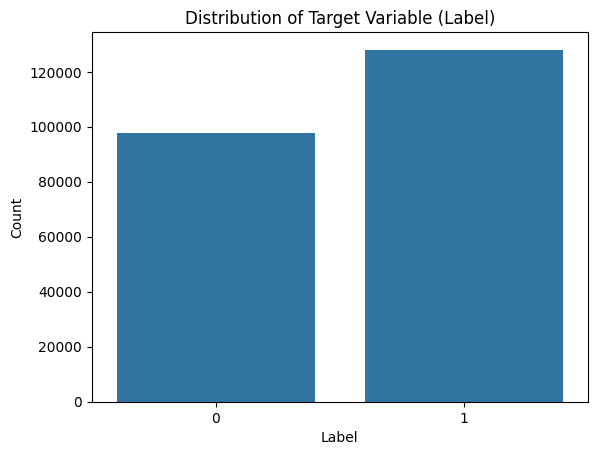

In [8]:
# Plotting the distribution of the target variable
sns.countplot(data=df, x='Label')
plt.title("Distribution of Target Variable (Label)")
plt.xlabel("Label")
plt.ylabel("Count")
plt.show()


First step is Knowing which features are the most important to help decide which features to keep or discard.

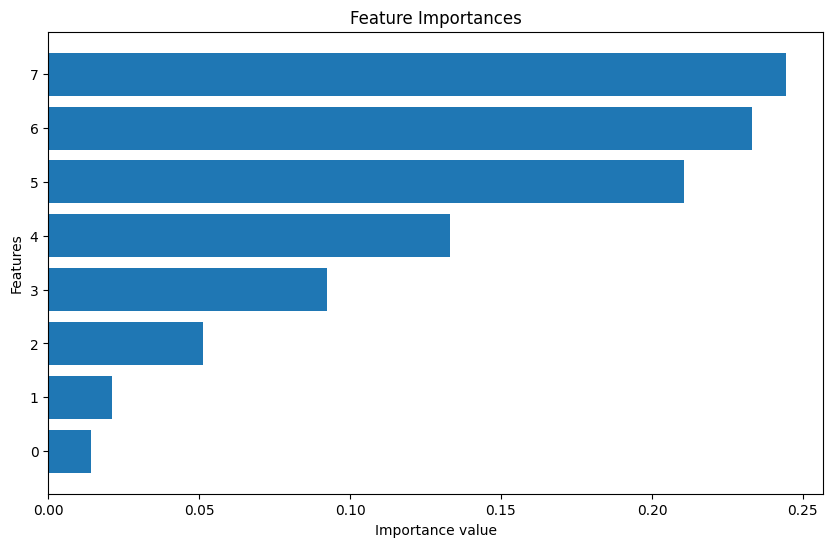

In [21]:
# Fit a RandomForest model and plot feature importance
from sklearn.ensemble import RandomForestClassifier

# Fit a RandomForest model
model = RandomForestClassifier(random_state=42)
model.fit(X_scaled_train, y_train)

# Plot feature importance
importances = model.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.barh(range(X_scaled_train.shape[1]), importances[indices], align="center")
plt.ylabel("Features")
plt.xlabel("Importance value")
plt.show()


### Reviser Project Question

#### How can machine learning models effectively differentiate between normal (BENIGN) and attack (DDoS) traffic in network data, and what impact do class imbalance and feature selection have on the model's performance?

#### Baseline Model:
- As a first step in the project, a baseline model will be implemented to evaluate the basic performance of a machine learning algorithm before any advanced techniques like feature engineering or hyperparameter tuning are applied.

- Model Choice: A simple model such as Logistic Regression will be used to establish a baseline, as it is easy to implement and provides a good starting point for binary classification tasks.

#### 5. Train Models Using Logistic Regression
Now, we’ll use Logistic Regression for classification, as it's suitable for binary classification tasks.

In [22]:
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, f1_score
# Create the pipeline
pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),  # Impute missing values
    ('scaler', StandardScaler()),  # Scale features
    ('classifier', LogisticRegression(random_state=42))  # Logistic Regression model
])

# Fit the model with the pipeline
pipeline.fit(X_train, y_train)

# Make predictions
y_pred_log_reg = pipeline.predict(X_test)

# Calculate Mean Squared Error (MSE) and F1 Score
log_reg_mse = mean_squared_error(y_test, y_pred_log_reg)
log_reg_f1 = f1_score(y_test, y_pred_log_reg, average='binary')

print(f"Logistic Regression - Mean Squared Error: {log_reg_mse}")
print(f"Logistic Regression - F1 Score: {log_reg_f1}")

Logistic Regression - Mean Squared Error: 0.03446366475447961
Logistic Regression - F1 Score: 0.9701572688914462


In [23]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
accuracy = accuracy_score(y_test, y_pred_log_reg)
print(f"Logistic Regression - accuracy: {log_reg_f1}")

Logistic Regression - accuracy: 0.9701572688914462


6. Boosting Mechanisms (XGBoost, AdaBoost, Gradient Boosting)
Boosting techniques can enhance model performance. Here, we use XGBoost, AdaBoost, and Gradient Boosting to see which performs best.

In [24]:
# XGBoost Model
xgb_model = xgb.XGBClassifier(random_state=42)
xgb_model.fit(X_scaled_train, y_train)

y_pred_xgb = xgb_model.predict(X_scaled_test)
xgb_mse = mean_squared_error(y_test, y_pred_xgb)
xgb_f1 = f1_score(y_test, y_pred_xgb, average='binary')

print(f"XGBoost - Mean Squared Error: {xgb_mse}")
print(f"XGBoost - F1 Score: {xgb_f1}")

# AdaBoost Model
ada_model = AdaBoostClassifier(random_state=42)
ada_model.fit(X_scaled_train, y_train)

y_pred_ada = ada_model.predict(X_scaled_test)
ada_mse = mean_squared_error(y_test, y_pred_ada)
ada_f1 = f1_score(y_test, y_pred_ada, average='binary')

print(f"AdaBoost - Mean Squared Error: {ada_mse}")
print(f"AdaBoost - F1 Score: {ada_f1}")

# Gradient Boosting Model
gb_model = GradientBoostingClassifier(random_state=42)
gb_model.fit(X_scaled_train, y_train)

y_pred_gb = gb_model.predict(X_scaled_test)
gb_mse = mean_squared_error(y_test, y_pred_gb)
gb_f1 = f1_score(y_test, y_pred_gb, average='binary')

print(f"Gradient Boosting - Mean Squared Error: {gb_mse}")
print(f"Gradient Boosting - F1 Score: {gb_f1}")


XGBoost - Mean Squared Error: 0.00019933996323285124
XGBoost - F1 Score: 0.9998251782210913


c:\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


AdaBoost - Mean Squared Error: 0.0005094243504839531
AdaBoost - F1 Score: 0.9995531464319714
Gradient Boosting - Mean Squared Error: 0.0004651265808766529
Gradient Boosting - F1 Score: 0.9995920032639739


#### Performance Analysis, evaluation metric and interpretation of the results

   Precision    Recall  F1 Score  Accuracy
0   0.958175  0.982443  0.970157  0.965536
Confusion Matrix:
[[18301  1104]
 [  452 25292]]


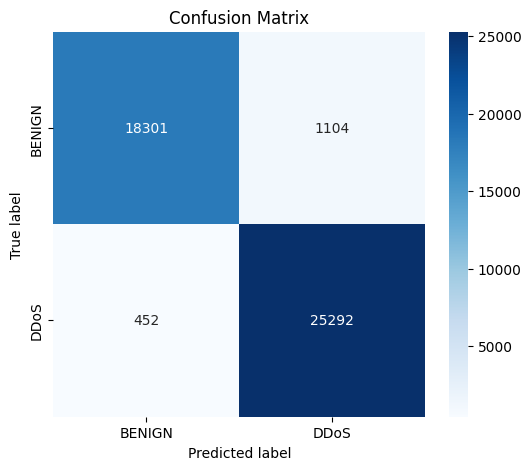

In [25]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
import pandas as pd

# Example: Using Logistic Regression Model (replace with your model, e.g., RandomForest, XGBoost, etc.)
# Make predictions on the test set
y_pred_log_reg = log_reg_model.predict(X_scaled_test)

# Calculate Precision, Recall, F1 Score, and Accuracy
precision = precision_score(y_test, y_pred_log_reg)
recall = recall_score(y_test, y_pred_log_reg)
f1 = f1_score(y_test, y_pred_log_reg)
accuracy = accuracy_score(y_test, y_pred_log_reg)

# Store the metrics in a dictionary
metrics = {
    "Precision": [precision],
    "Recall": [recall],
    "F1 Score": [f1],
    "Accuracy": [accuracy]
}

# Create a DataFrame for the metrics
metrics_df = pd.DataFrame(metrics)

# Display the metrics as a table
print(metrics_df)

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred_log_reg)
print("Confusion Matrix:")
print(cm)

# Optionally, you can plot the confusion matrix
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['BENIGN', 'DDoS'], yticklabels=['BENIGN', 'DDoS'])
plt.title("Confusion Matrix")
plt.ylabel("True label")
plt.xlabel("Predicted label")
plt.show()


##### 7. Load the models and scaler:
##### Later, when you want to use the saved models or scaler, you can load them using joblib.load(). Here's how you can load the saved models and scaler:

In [26]:
import joblib
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
import xgboost as xgb

# Assuming you have already trained your models and scaler:

# Save the Logistic Regression model
joblib.dump(log_reg_model, 'log_reg_model.pkl')

# Save the XGBoost model
joblib.dump(xgb_model, 'xgb_model.pkl')

# Save the AdaBoost model
joblib.dump(ada_model, 'ada_model.pkl')

# Save the Gradient Boosting model
joblib.dump(gb_model, 'gb_model.pkl')

# Save the scaler
joblib.dump(scaler, 'scaler.pkl')

# Load the models and scaler when needed
log_reg_model = joblib.load('log_reg_model.pkl')
xgb_model = joblib.load('xgb_model.pkl')
ada_model = joblib.load('ada_model.pkl')
gb_model = joblib.load('gb_model.pkl')
scaler = joblib.load('scaler.pkl')


#### Testing Model on External Unseen Data 
-  This basically means unseen data, which was not present in testing and traing dataset. This proves that the model is working properly and not  overfitted.

In [27]:
import pandas as pd

# Load the new dataset (replace with your actual file path)
new_data = pd.read_csv(r'C:\Users\aaron\Desktop\archive\archive\data\Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv')

new_data.columns = new_data.columns.str.strip()

# Check the column names to ensure they are correct
print(new_data.columns)



Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Min Packet Length', 'Max Packet Length', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count',
       'SYN Flag Co

In [30]:

# Fill missing values with 0
new_data_filled = new_data.fillna(0)

# Select the same features as used in training
X_new_data = new_data_filled[['Destination Port', 'Flow Duration', 'Total Fwd Packets', 'Total Backward Packets', 
                               'Total Length of Fwd Packets', 'Total Length of Bwd Packets', 'Flow Bytes/s', 'Flow Packets/s']].values

# Replace infinite values with 0
X_new_data = np.where(np.isinf(X_new_data), 0, X_new_data)

# Step 4: Use the same scaler from training to scale the new data
# Assuming `scaler` was already fitted during training
X_scaled_new_data = scaler.transform(X_new_data)

# Step 5: Make predictions using the trained model (replace with your actual trained model)
# Assuming `log_reg_model` is the trained model, replace with your model if different
y_pred_new_data = log_reg_model.predict(X_scaled_new_data)

# Map predictions back to readable labels (0 -> 'BENIGN', 1 -> 'DDoS')
predictions_labels = ['BENIGN' if pred == 0 else 'DDoS' for pred in y_pred_new_data]

# Print the predicted labels for all rows in the new data
print("Predicted labels for the new data:")
for i, label in enumerate(predictions_labels):
    print(f"Data Point {i+1}: Predicted label = {label}")
    


Predicted labels for the new data:
Data Point 1: Predicted label = BENIGN
Data Point 2: Predicted label = BENIGN
Data Point 3: Predicted label = BENIGN
Data Point 4: Predicted label = BENIGN
Data Point 5: Predicted label = DDoS
Data Point 6: Predicted label = BENIGN
Data Point 7: Predicted label = BENIGN
Data Point 8: Predicted label = BENIGN
Data Point 9: Predicted label = BENIGN
Data Point 10: Predicted label = BENIGN
Data Point 11: Predicted label = BENIGN
Data Point 12: Predicted label = BENIGN
Data Point 13: Predicted label = BENIGN
Data Point 14: Predicted label = BENIGN
Data Point 15: Predicted label = BENIGN
Data Point 16: Predicted label = BENIGN
Data Point 17: Predicted label = BENIGN
Data Point 18: Predicted label = BENIGN
Data Point 19: Predicted label = BENIGN
Data Point 20: Predicted label = BENIGN
Data Point 21: Predicted label = BENIGN
Data Point 22: Predicted label = BENIGN
Data Point 23: Predicted label = BENIGN
Data Point 24: Predicted label = BENIGN
Data Point 25: P